In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import log
import ultranest
from ultranest.plot import cornerplot
from scipy.stats import poisson
import pandas as pd
import healpy as hp
from healpy.newvisufunc import projview, newprojplot
import astropy.units as u
from matplotlib import colors as mcolors
from ultranest.utils import resample_equal
from scipy.interpolate import interp1d
import scipy.stats as stats
import ultranest.stepsampler
import itertools
import gc
import json
import corner
import os

In [2]:
# Import functions
from my_functions import *

In [3]:
def dipole_prior_transform(cube):
    params = cube.copy()
    params[0] = cube[0]*200 # 0 - 100
    params[1] = cube[1]/10 # 0 - 0.1
    params[2] = cube[2]*2*np.pi # 0 - 2pi
    
    c = cube[3] # 0 - 1, used to calculate theta below. 
    
    params[3] = np.arccos(np.clip(1 - 2*c, -1, 1)) #Clipping to ensure we stay in the valid range
    
    return params
    
def dipole_likelihood(params):
    N_bar, D, l, b = params
    dipole_vec = hp.ang2vec(b, l) # dipole vector in cartesian
    pixels = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX)))
    
    dot_product = np.dot(dipole_vec, pixels)  
    angles = np.arccos(dot_product)
    dipole_signal = D*np.cos(angles)
    
    lambda_i = N_bar * (1 + dipole_signal)
    
    return np.sum(poisson.logpmf(m, mu=lambda_i))

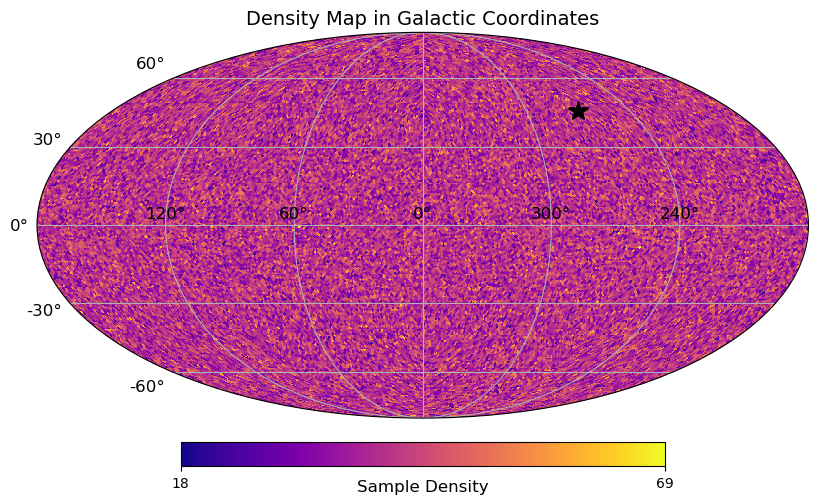

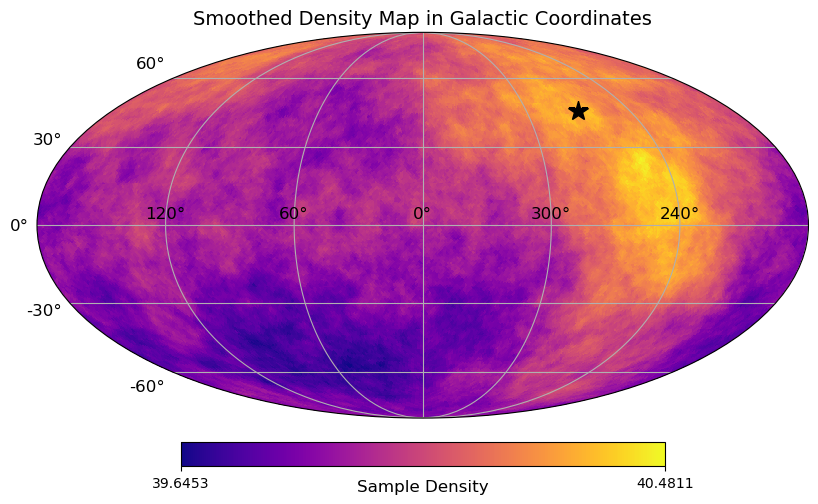

In [4]:
NSIDE=64
NPIX = hp.nside2npix(NSIDE)
N_bar_true = 40
D_true = 0.007 # dipole amplitude, using value from paper

#  dipole vector
dipole_theta = np.pi/4
dipole_phi = -np.pi/2
np.random.seed(42)
m, lambda_true_array = dipole_sampling(NSIDE=NSIDE,  N_bar=40, D=0.007,
                                       dipole_theta=dipole_theta, dipole_phi=dipole_phi)

#Unsmoothed
dipole_plotting(m, dipole_theta, dipole_phi,
         title='Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')

smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

#Smoothed
dipole_plotting(smoothed_map, dipole_theta, dipole_phi,
         title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')

In [ ]:
dipole_param_names = [r'$\bar N$', 'D', r'$\ell$', 'b']
dipole_sampler = ultranest.ReactiveNestedSampler(dipole_param_names, dipole_likelihood,
                                                 dipole_prior_transform, log_dir='../log_dir/dipole_UN_runs/run1',
                                                 resume=True)
dipole_result = dipole_sampler.run()
dipole_sampler.print_results()

In [ ]:
dipole_sampler.plot()

In [ ]:
cornerplot(dipole_result, truths=[N_bar_true, D_true, np.pi - dipole_phi, dipole_theta], truth_color='r')
plt.show()

# Quadrupole

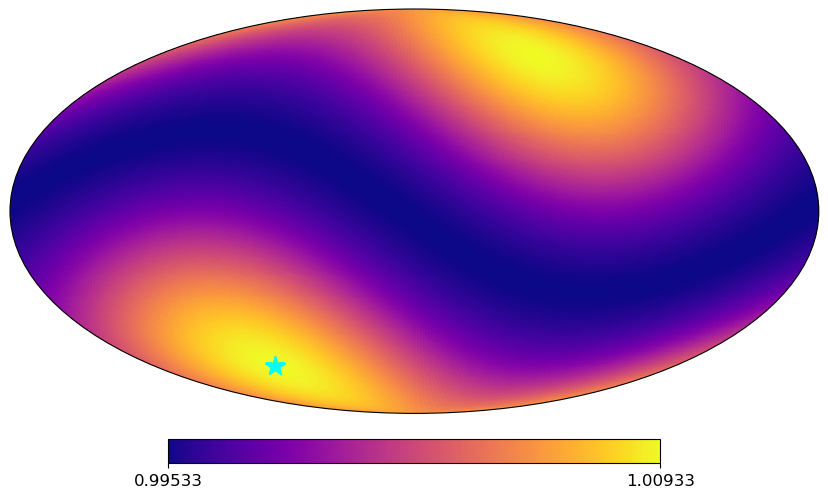

In [13]:
# theta1, phi1 = np.pi/2, -np.pi/3
# theta2, phi2 = np.pi/4, np.pi/3


# Values in Oliver's Paper, the figure matches finally!
theta1, phi1 = np.pi/2 - -np.deg2rad(60.2), np.deg2rad(96.3)
theta2, phi2 = np.pi/2 - -np.deg2rad(60.2), np.deg2rad(96.3)

pixels = hp.pix2vec(NSIDE, np.arange(NPIX))

a = hp.ang2vec(theta1, phi1)
b = hp.ang2vec(theta2, phi2)

Q_prime = np.outer(a, b)
Q_star = 1/2 * (Q_prime + Q_prime.T)
Q_hat = Q_star - (np.trace(Q_star)/3 * np.eye(3))

Q = 0.014

f = Q*np.einsum('ij,i...,j...', Q_hat, pixels, pixels)

# 'Raw Signal'
m = 1 + f
hp.projview(m, cmap='plasma')
newprojplot(theta1, phi1, marker="*", color="cyan", markersize=15);
newprojplot(theta2, phi2, marker="*", color="cyan", markersize=15);
plt.tight_layout()
# plt.savefig('../Figures/quadrupole_raw_signal.png', dpi=300)
plt.show()
plt.close()


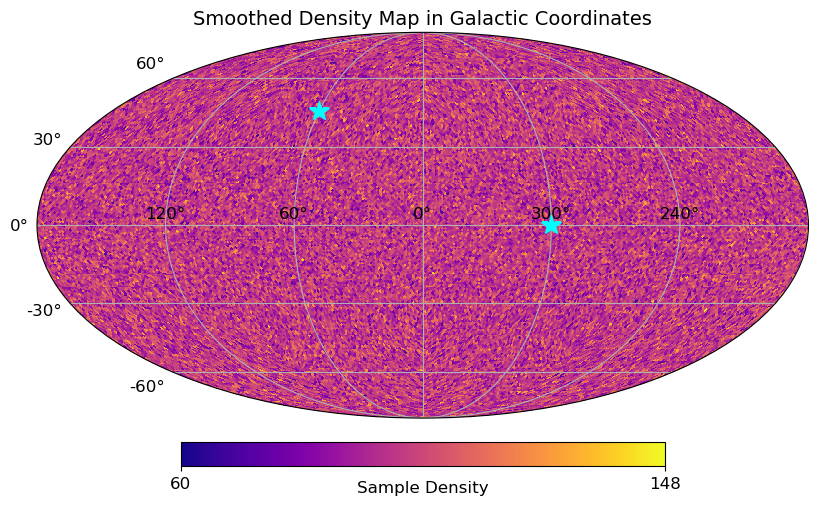

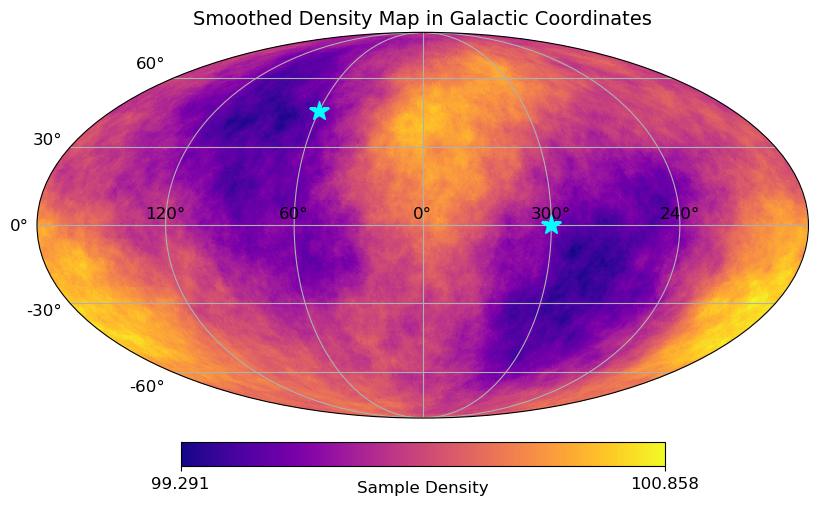

In [14]:
vector_1 = [np.pi/2, -np.pi/3]
vector_2 = [np.pi/4, np.pi/3]
m, lambda_true_array = quadrupole_sampling(NSIDE=64,  N_bar=100, Q=0.014, vector_1=vector_1, vector_2=vector_2)

quadrupole_plotting(m, vector_1, vector_2,
         title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')

smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

quadrupole_plotting(smoothed_map, vector_1, vector_2,
         title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')


In [ ]:
def quadrupole_prior_transform(cube):
    
    params = cube.copy()
    params[0] = cube[0]*200 # 0 - 2000 (Nbar)
    params[1] = cube[1]/5 # 0 - 0.2 (Q)
    params[2] = cube[2]*2*np.pi # 0 - 2pi (l1)
    
    c = cube[3] # 0 - 1, used to calculate theta below. 
    params[3] = np.arccos(np.clip(1 - 2*c, -1, 1)) #(b1)
    
    params[4] = cube[4]*2*np.pi # 0 - 2pi (l2)
    params[5] = np.arccos(np.clip(1 - 2*c, -1, 1)) #(b2)
    
    return params
    
def quadrupole_likelihood(params):
    N_bar, Q, l1, b1, l2, b2 = params
    
    pixels = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX)))
    
    v1 = hp.ang2vec(b1, l1)
    v2 = hp.ang2vec(b2, l2)
    
    Q_prime = np.outer(v1, v2)
    Q_star = 1/2 * (Q_prime + Q_prime.T)
    Q_hat = Q_star - (np.trace(Q_star)/3 * np.eye(3))

    quad_signal = Q*np.einsum('ij,i...,j...', Q_hat, pixels, pixels)
    
    lambda_i = N_bar * (1 + quad_signal)
    
    return np.sum(poisson.logpmf(m, mu=lambda_i))

In [ ]:
quad_param_names = [r'$\bar N$', 'Q', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$']
quad_sampler = ultranest.ReactiveNestedSampler(quad_param_names, quadrupole_likelihood,
                                               quadrupole_prior_transform)

quad_sampler.stepsampler = ultranest.stepsampler.SliceSampler(
    nsteps=10,
    generate_direction = (ultranest.stepsampler.generate_mixture_random_direction))

quad_result = quad_sampler.run()
quad_sampler.print_results()

In [ ]:
cornerplot(quad_result, truths=[100, 0.014, 2*np.pi - np.pi/3, np.pi/2, np.pi/3, np.pi/4], truth_color='r')
# plt.savefig('../Figures/quadrupole_cornerplot.png',dpi=300)
plt.show()

In [ ]:
def quadrupole_direction_distribution(result, quad_vec1, quad_vec2):
    def process_vector_component(l, b, nside, smooth_sigma):
        pixels = hp.ang2pix(nside, b, l, nest=False)
        healpix_map = np.bincount(pixels, minlength=hp.nside2npix(nside)).astype(np.float64)
        healpix_map /= healpix_map.sum()
        smoothed_map = hp.sphtfunc.smoothing(healpix_map, sigma=smooth_sigma)
        smoothed_map[smoothed_map < 0] = 0
        smoothed_map /= smoothed_map.sum()
        return smoothed_map

    # Sample and setup
    samples = resample_equal(
        np.array(result['samples']),
        np.array(result['weighted_samples']['weights']))
    
    l1, b1 = samples[:, 2], samples[:, 3]
    l2, b2 = samples[:, 4], samples[:, 5]

    nside = 64
    smooth_sigma = 0.1

    # Process both vector maps
    smooth_map1 = process_vector_component(l1, b1, nside, smooth_sigma)
    smooth_map2 = process_vector_component(l2, b2, nside, smooth_sigma)

    # Generate projections and compute contours
    def get_projection_and_contours(hmap, contour_levels=[0.5, 1, 1.5]):
        X, Y, proj_map = hp.projview(hmap, return_only_data=True, xsize=2000)
        P_xy = proj_map / proj_map.sum()
        t_contours, P_levels, P_integral = compute_2D_contours(P_xy, contour_levels)
        return X, Y, P_xy, t_contours

    X1, Y1, P_xy1, t_contours1 = get_projection_and_contours(smooth_map1)
    X2, Y2, P_xy2, t_contours2 = get_projection_and_contours(smooth_map2)

    # Plot
    hp.projview(smooth_map1, cmap="Blues", graticule=True, graticule_labels=True)
#     hp.projview(smooth_map2, cmap="Blues", graticule=True, graticule_labels=True)

    newprojplot(theta=quad_vec1[0], phi=quad_vec1[1], marker="*", color="r", markersize=15, zorder=5)
    newprojplot(theta=quad_vec2[0], phi=quad_vec2[1], marker="*", color="r", markersize=15, zorder=5)

    plt.contour(X1, Y1, P_xy1, levels=t_contours1, colors=['b', 'b', 'b'])
    plt.contour(X2, Y2, P_xy2, levels=t_contours2, colors=['r', 'r', 'r'])

    plt.tight_layout()
    return


In [ ]:
quadrupole_direction_distribution(quad_result, vector_1, vector_2)

# Test dipole model and compare:

In [ ]:
dipole_param_names = [r'$\bar N$', 'D', r'$\ell$', 'b']
dipole_sampler = ultranest.ReactiveNestedSampler(dipole_param_names, dipole_likelihood, dipole_prior_transform)
dipole_result = dipole_sampler.run()
dipole_sampler.print_results()

In [ ]:
cornerplot(dipole_result, truths=[N_bar_true, None, None, None], truth_color='r')
plt.show()

In [ ]:
dipole_direction_distribution(dipole_result, np.pi/2, 0)

In [ ]:
ln_K = (dipole_result['logz'] - quad_result['logz']) # The ln of the Bayes Factor
print(ln_K)

So the quadrupole model is favoured

# Dipole and Quadrupole Signal

In [5]:
def dipole_quad_sampling(NSIDE, N_bar, D, d_vector, Q, q_vector_1, q_vector_2):
    NPIX = hp.nside2npix(NSIDE)
    dipole_theta, dipole_phi = d_vector[0], d_vector[1]
    dipole_vec = hp.ang2vec(dipole_theta, dipole_phi) # (x, y, z) from (b, l) shape (1, 3)

    pixels = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX))) # shape (3, NPIX)
    
    dot_product = np.dot(dipole_vec, pixels)  # returns shape (NPIX, )
    angles = np.arccos(dot_product) # shape (NPIX, )
    dipole_signal = D*np.cos(angles) # shape (NPIX, )
    
    # Quadrupole tensor
    b1, l1 = q_vector_1[0], q_vector_1[1]
    b2, l2 = q_vector_2[0], q_vector_2[1]
    
    # Constructing quadrupole tensor using the outer product of the 2 vectors
    v1 = hp.ang2vec(b1, l1)
    v2 = hp.ang2vec(b2, l2)
    Q_prime = np.outer(v1, v2)
    Q_star = 1/2 * (Q_prime + Q_prime.T)
    Q_hat = Q_star - (np.trace(Q_star)/3 * np.eye(3))

    # Quadrupole signal
    quad_signal = Q*np.einsum('ij,i...,j...', Q_hat, pixels, pixels)
    
    lambda_ = N_bar * (1 + dipole_signal + quad_signal)
    sample = np.random.poisson(lambda_)
    
    return sample, lambda_

def dipole_quad_plotting(m, d_vector=None, q_vector_1=None, q_vector_2=None, title=None, unit=None, cmap='viridis'):
    projview(m, title=title, unit=unit,
    graticule=True, graticule_labels=True, projection_type="mollweide", cmap=cmap);
    
    newprojplot(theta=d_vector[0], phi=d_vector[1], marker="*", color="b", markersize=15);
    newprojplot(theta=q_vector_1[0], phi=q_vector_1[1], marker="*", color="lightskyblue", markersize=15);
    newprojplot(theta=q_vector_2[0], phi=q_vector_2[1], marker="*", color="lightskyblue", markersize=15);
    plt.tight_layout()

    return


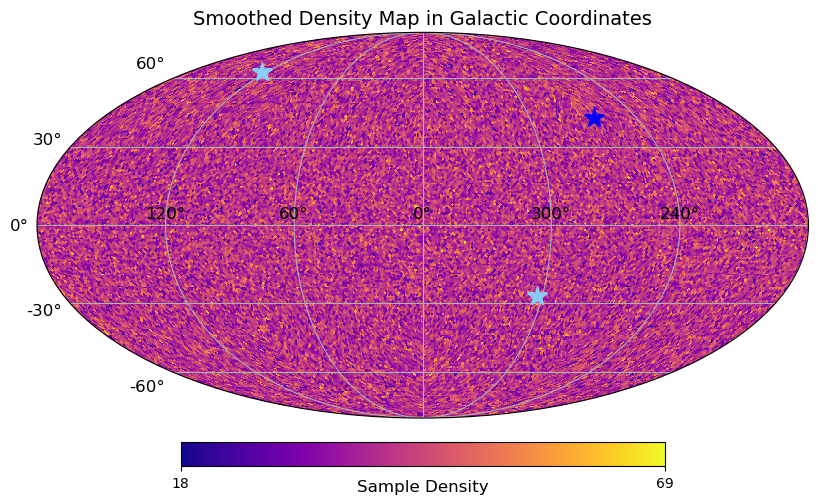

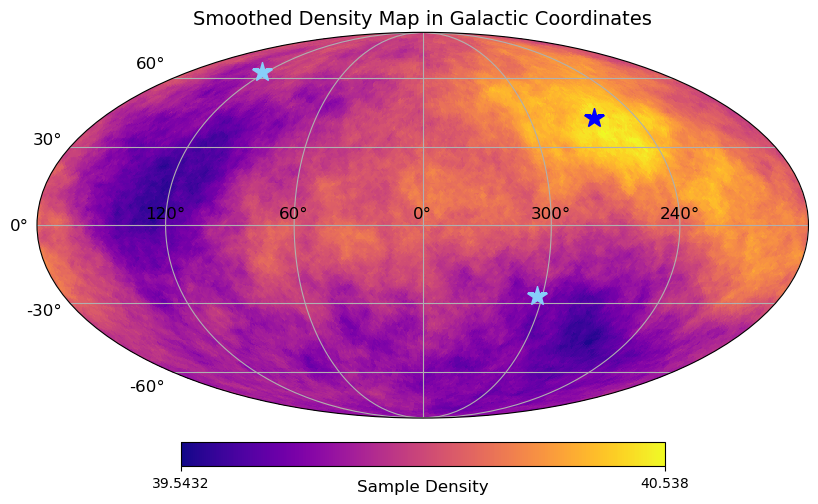

In [7]:
np.random.seed(42)
NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
N_bar_true = 40
dipole_theta = np.radians(48)
dipole_phi = -np.radians(96)
dipole_vector = [np.radians(48), -np.radians(96)]
quad_vector_1 = [np.pi/4, np.pi*4/5]
quad_vector_2 = [np.pi*3/4 , -np.pi/4]
quad_vector_1 = [np.deg2rad(90+27.1), -np.deg2rad(360-302.9)]
quad_vector_2 = [np.deg2rad(27.1), np.deg2rad(122.9)]

m, lambda_true_array = dipole_quad_sampling(NSIDE=64,  N_bar=N_bar_true, D=0.007, d_vector=dipole_vector,
                                          Q=0.014, q_vector_1=quad_vector_1, q_vector_2=quad_vector_2)

dipole_quad_plotting(m, dipole_vector, quad_vector_1, quad_vector_2,
         title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')

smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

dipole_quad_plotting(smoothed_map, dipole_vector, quad_vector_1, quad_vector_2,
         title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
        cmap='plasma')

# Run Dipole Model:

In [ ]:
dipole_param_names = [r'$\bar N$', 'D', r'$\ell$', 'b']
dipole_sampler = ultranest.ReactiveNestedSampler(dipole_param_names, dipole_likelihood, dipole_prior_transform)
dipole_result = dipole_sampler.run()
dipole_sampler.print_results()

In [ ]:
cornerplot(dipole_result, truths=[N_bar_true, D_true, 2*np.pi - np.radians(96), np.radians(48)], truth_color='r')
plt.show()

In [ ]:
dipole_direction_distribution(dipole_result, dipole_theta, dipole_phi)

# Run Quadrupole Model:

In [ ]:
quad_param_names = [r'$\bar N$', 'Q', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$']
quad_sampler = ultranest.ReactiveNestedSampler(quad_param_names, quadrupole_likelihood,
                                               quadrupole_prior_transform)

quad_sampler.stepsampler = ultranest.stepsampler.SliceSampler(
    nsteps=10,
    generate_direction = (ultranest.stepsampler.generate_mixture_random_direction))

quad_result = quad_sampler.run()
quad_sampler.print_results()

In [ ]:
cornerplot(quad_result, truths=[100, 0.014, np.pi/4, np.pi*4/5, np.pi*3/4 ,  2*np.pi - np.pi/4], truth_color='r')
plt.show()

In [ ]:
quadrupole_direction_distribution(quad_result, quad_vector_1, quad_vector_2)

# Run Dipole + Quadrupole model:

In [21]:
def model_3_prior(cube):
    params = cube.copy()
    params[0] = cube[0]*200 # 0 - 200 (Nbar)
    params[1] = cube[1]/10 # 0 - 0.1 (D)
    params[2] = cube[2]/5 # 0 - 0.2 (Q)
    
    params[3] = cube[3]*2*np.pi # 0 - 2pi (l)
    c = cube[4] # 0 - 1, used to calculate theta below. 
    params[4] = np.arccos(np.clip(1 - 2*c, -1, 1)) #(b)
    
    params[5] = cube[5]*2*np.pi # 0 - 2pi (l1)
    c = cube[6] # 0 - 1, used to calculate theta below. 
    params[6] = np.arccos(np.clip(1 - 2*c, -1, 1)) #(b1)
    
    params[7] = cube[7]*2*np.pi # 0 - 2pi (l2)
    c = cube[8] # 0 - 1, used to calculate theta below. 
    params[8] = np.arccos(np.clip(1 - 2*c, -1, 1)) #(b2)
    return params

def model_3_likelihood(params):
    N_bar, D, Q, l, b, l1, b1, l2, b2 = params

    dipole_vec = hp.ang2vec(b, l)
    pixels = hp.pix2vec(NSIDE, np.arange(NPIX))
    pixel_vec = np.vstack(hp.pix2vec(NSIDE, np.arange(NPIX))).T
    angles = pixel_angles(pixel_vec, dipole_vec)
    
    a = hp.ang2vec(b1, l1)
    b = hp.ang2vec(b2, l2)
    
    Q_prime = np.outer(a, b)
    Q_star = 1/2 * (Q_prime + Q_prime.T)
    Q_hat = Q_star - (np.trace(Q_star)/3 * np.eye(3))

    f = Q*np.einsum('ij,i...,j...', Q_hat, pixels, pixels)
    
    lambda_i = N_bar * (1 + D*np.cos(angles) + f)
    
    return np.sum(poisson.logpmf(m, mu=lambda_i))

In [ ]:
mod3_param_names = [r'$\bar N$', 'D', 'Q', r'$\ell$', r'$b$', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$']
mod3_sampler = ultranest.ReactiveNestedSampler(mod3_param_names, model_3_likelihood,
                                               model_3_prior)

mod3_sampler.stepsampler = ultranest.stepsampler.SliceSampler(
    nsteps=10,
    generate_direction = (ultranest.stepsampler.generate_mixture_random_direction))

mod3_result = mod3_sampler.run()
mod3_sampler.print_results()

In [ ]:
cornerplot(mod3_result, truths=[180, 0.007, 0.014, 2*np.pi - np.radians(96), np.radians(48),
                                 np.pi/4, np.pi*4/5, np.pi*3/4 ,  2*np.pi - np.pi/4], truth_color='r')
# plt.savefig('../Figures/combined_model_cornerplot.png', dpi=300)
plt.show()


# Bayes Factors

In [ ]:
ln_I = (mod3_result['logz'] - quad_result['logz']) 
ln_J = (mod3_result['logz'] - dipole_result['logz'])
ln_K = (dipole_result['logz'] - quad_result['logz'])
print(r'Dipole + Quadrupole vs Quadrupole: ',ln_I)
print(r'Dipole + Quadrupole vs Dipole: ',ln_J)
print(r'Dipole vs Quadrupole: ',ln_K)


In [ ]:
def direction_distribution(result, dipole_vec, quad_vec1, quad_vec2):
    def process_vector_component(l, b, nside, smooth_sigma):
        pixels = hp.ang2pix(nside, b, l, nest=False)
        healpix_map = np.bincount(pixels, minlength=hp.nside2npix(nside)).astype(np.float64)
        healpix_map /= healpix_map.sum()
        smoothed_map = hp.sphtfunc.smoothing(healpix_map, sigma=smooth_sigma)
        smoothed_map[smoothed_map < 0] = 0
        smoothed_map /= smoothed_map.sum()
        return smoothed_map

    # Sample and setup
    samples = resample_equal(
        np.array(result['samples']),
        np.array(result['weighted_samples']['weights']))
    
    l, b = samples[:, 3], samples[:, 4]
    l1, b1 = samples[:, 5], samples[:, 6]
    l2, b2 = samples[:, 6], samples[:, 8]

    nside = 64
    smooth_sigma = 0.1

    # Process both vector maps
    smooth_map = process_vector_component(l, b, nside, smooth_sigma)
    smooth_map1 = process_vector_component(l1, b1, nside, smooth_sigma)
    smooth_map2 = process_vector_component(l2, b2, nside, smooth_sigma)

    # Generate projections and compute contours
    def get_projection_and_contours(hmap, contour_levels=[0.5, 1, 1.5, 2]):
        X, Y, proj_map = hp.projview(hmap, return_only_data=True, xsize=2000)
        P_xy = proj_map / proj_map.sum()
        t_contours, P_levels, P_integral = compute_2D_contours(P_xy, contour_levels)
        return X, Y, P_xy, t_contours
    
    X, Y, P_xy, t_contours = get_projection_and_contours(smooth_map)
    X1, Y1, P_xy1, t_contours1 = get_projection_and_contours(smooth_map1)
    X2, Y2, P_xy2, t_contours2 = get_projection_and_contours(smooth_map2)
    
    # Plot
    hp.projview(smooth_map, cmap="Blues", graticule=True, graticule_labels=True)
#     hp.projview(smooth_map2, cmap="Blues", graticule=True, graticule_labels=True)

    newprojplot(theta=dipole_vec[0], phi=dipole_vec[1], marker="*", color="b", markersize=15, zorder=5)
    newprojplot(theta=quad_vec1[0], phi=quad_vec1[1], marker="*", color="r", markersize=15, zorder=5)
    newprojplot(theta=quad_vec2[0], phi=quad_vec2[1], marker="*", color="r", markersize=15, zorder=5)

    plt.contour(X, Y, P_xy, levels=t_contours, colors=['b', 'b', 'b'])
    plt.contour(X1, Y1, P_xy1, levels=t_contours1, colors=['C1', 'C1', 'C1'])
    plt.contour(X2, Y2, P_xy2, levels=t_contours2, colors=['r', 'r', 'r'])

    plt.tight_layout()
    return

In [ ]:
direction_distribution(mod3_result, dipole_vector, quad_vector_1, quad_vector_2)
# plt.savefig('../Figures/combined_direction_distributions_nbar_180.png',dpi=300)

# I want to explore how changing the amplitude of D and Q, and the number density affects the inference. 

## Plan: Compare log(BF) with Nbar vs D/Q ratio (using the ratio bc then we can compare 2 variables not 3). This might be flawed, bc if D = 0.01 and Q = 0.01 D/Q = 1, but will this give the same as D=0.1, Q=0.1? Need to check as well.
1. Fix the number density
2. Fix D
3. Vary over increasing Q
4. Increase number density and repeat

In [ ]:
def generate_data(Nbar_list, D_list, Q_list, pathname):
    # generate data, make sure to save it for reproducibility 
    np.random.seed(42)
    NSIDE = 64
    NPIX = hp.nside2npix(NSIDE)
    dipole_theta = np.radians(48)
    dipole_phi = -np.radians(96)
    dipole_vector = [np.radians(48), -np.radians(96)]
    quad_vector_1 = [np.pi/4, np.pi*4/5]
    quad_vector_2 = [np.pi*3/4 , -np.pi/4]

    param_combinations = itertools.product(Nbar_list, D_list, Q_list)
    
    for N_bar_true, D_true, Q_true in param_combinations:
        m, lambda_true_array = dipole_quad_signal(NSIDE=64,  Nbar=N_bar_true, D=D_true,
                                                  d_vector=dipole_vector, Q=Q_true,
                                                  q_vector_1=quad_vector_1, q_vector_2=quad_vector_2)
        metadata = {
            'Nbar': N_bar_true,
            'D': D_true,
            'Q': Q_true,
            'NSIDE': NSIDE,
            'NPIX': NPIX,
            'dipole_vector': dipole_vector,
            'quad_vector_1': quad_vector_1,
            'quad_vector_2': quad_vector_2
        }
        
        data_to_save = {
            'm': m,
            'metadata': metadata
        }
        
        np.save(pathname+f"Datasets/skymap_data_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}.npy", data_to_save)
        
    #Not plotting in the main run to decrease time complexity. Instead, saving the array with the raw data.
#     mixed_plotting(m, dipole_vector, quad_vector_1, quad_vector_2,
#          title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
#         cmap='plasma')

#     smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

#     mixed_plotting(smoothed_map, dipole_vector, quad_vector_1, quad_vector_2,
#          title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
#         cmap='plasma')

#         break
    return

In [ ]:
# Fit each model. Again for time, I am just running them based off the already made data (which was saved) 
# and saving each of the runs to the designated folder. I should be able to interupt at any time, and then 
# resume and pick up where I left off. Need to test that though.

def fit_models(Nbar_list, D_list, Q_list, pathname):
    dipole_param_names = [r'$\bar N$', 'D', r'$\ell$', 'b']
    quad_param_names = [r'$\bar N$', 'Q', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$']
    mod3_param_names = [r'$\bar N$', 'D', 'Q', r'$\ell$', r'$b$', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$']
    
    param_combinations = itertools.product(Nbar_list, D_list, Q_list)
    
    for N_bar_true, D_true, Q_true in param_combinations:
        # First load the data and metadata
        data = np.load(pathname+f'Datasets/Raw_files/skymap_data_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}.npy',
                       allow_pickle=True).item()
        m = data['m']
        metadata = data['metadata']
        
        
        #perform model 1 fitting (dipole)
        dipole_sampler = ultranest.ReactiveNestedSampler(dipole_param_names, dipole_likelihood, dipole_prior_transform,
                        log_dir=pathname+f'dipole_model/dipole_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}',
                                                        resume=True)
        dipole_result = dipole_sampler.run()
#         dipole_sampler.print_results()

        #perform model 2 fitting (quadrupole)
        quad_sampler = ultranest.ReactiveNestedSampler(quad_param_names, quadrupole_likelihood, quadrupole_prior_transform, 
            log_dir=pathname+f'quadrupole_model/quadrupole_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}',
                                                      resume=True)

        quad_sampler.stepsampler = ultranest.stepsampler.SliceSampler(
            nsteps=10,
            generate_direction = (ultranest.stepsampler.generate_mixture_random_direction))

        quad_result = quad_sampler.run()
#         quad_sampler.print_results()

        #perform model 3 fitting (dipole and quadrupole)
        mod3_sampler = ultranest.ReactiveNestedSampler(mod3_param_names, model_3_likelihood, model_3_prior,
                log_dir=pathname+f'dipole_quadrupole_model/dipole_quadrupole_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}',
                                                       resume=True)

        mod3_sampler.stepsampler = ultranest.stepsampler.SliceSampler(
            nsteps=10,
            generate_direction = (ultranest.stepsampler.generate_mixture_random_direction))

        mod3_result = mod3_sampler.run()
#         mod3_sampler.print_results()
        
        #perform model 4 fitting (to come)
        
        print(f'Finished: Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true} \n')
        del data, m, metadata, dipole_vector, quad_vector_1, quad_vector_2, smoothed_map
        gc.collect()
#         break
    
    return

In [ ]:
Nbar_list = [0.1,0.5,1,5,10,25,50,75,100,150]
D_list = [0.005,0.01,0.02,0.05,0.075,0.1]
Q_list = [0.005,0.01,0.02,0.05,0.075,0.1,0.12,0.15,0.175,0.2]

# To decrease time complexity, I'll do it in chuncks:
# First generate all the data
pathname='../log_dir/Dipole_and_Quadrupole_Data/'
generate_data(Nbar_list, D_list, Q_list, pathname)

In [ ]:
# Then read a given dataset in and fit the models:
fit_models(Nbar_list, D_list, Q_list, pathname)

In [ ]:
# Reading saved data back in
data = np.load(pathname+'skymap_data_Nbar_0.1_D_0.005_Q_0.005.npy', allow_pickle=True).item()
m = data['m']
metadata = data['metadata']
metadata

# Now Reading in the Data and NS Models to analyse

In [ ]:
# Creating the raw and smoothed skymaps

def read_data(Nbar_list, D_list, Q_list, pathname):
    param_combinations = itertools.product(Nbar_list, D_list, Q_list)
    counter=0
    for N_bar_true, D_true, Q_true in param_combinations:
        if counter < 343:
            counter +=1
        else:
            # First load the data and metadata
            data = np.load(pathname+f'Datasets/Raw_files/skymap_data_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}.npy',
                           allow_pickle=True).item()
            m = data['m']
            metadata = data['metadata']
            dipole_vector = metadata['dipole_vector']
            quad_vector_1 = metadata['quad_vector_1']
            quad_vector_2 = metadata['quad_vector_2']

            mixed_plotting(m, dipole_vector, quad_vector_1, quad_vector_2,
                        title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
                            cmap='plasma')

            plt.savefig(pathname+f'Datasets/Skymaps/skymap_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}.png',dpi=300)
            plt.close()

            smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

            mixed_plotting(smoothed_map, dipole_vector, quad_vector_1, quad_vector_2,
                        title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
                            cmap='plasma')

            plt.savefig(
                pathname+f'Datasets/Smoothed_Skymaps/smoothed_skymap_Nbar_{N_bar_true}_D_{D_true}_Q_{Q_true}.png',
                dpi=300)
            plt.close()

            print(counter)
            counter+=1

            del data, m, metadata, dipole_vector, quad_vector_1, quad_vector_2, smoothed_map
            gc.collect()
    
    return 


In [ ]:
Nbar_list = [0.1, 0.5, 1, 5, 10, 25, 50, 75, 100, 150]
D_list = [0.005, 0.01, 0.02, 0.05, 0.075, 0.1]
Q_list = [0.005, 0.01, 0.02, 0.05, 0.075, 0.1, 0.12, 0.15, 0.175, 0.2]
pathname = '../log_dir/Dipole_and_Quadrupole_Data/'

read_data(Nbar_list, D_list, Q_list, pathname)


In [ ]:
import os

filepath = '../log_dir/Dipole_and_Quadrupole_Data/Datasets/Raw_files/skymap_data_Nbar_10_D_0.02_Q_0.12.npy'

size = os.path.getsize(filepath)
print(f"File size: {size} bytes")

if size == 0:
    print("File is empty.")


# reading in and looping to crete figures

In [4]:
def process_vector_component(l, b, nside, smooth_sigma):
        pixels = hp.ang2pix(nside, b, l, nest=False)
        healpix_map = np.bincount(pixels, minlength=hp.nside2npix(nside)).astype(np.float64)
        healpix_map /= healpix_map.sum()
        smoothed_map = hp.sphtfunc.smoothing(healpix_map, sigma=smooth_sigma)
        smoothed_map[smoothed_map < 0] = 0
        smoothed_map /= smoothed_map.sum()
        return smoothed_map
        

def get_projection_and_contours(hmap, contour_levels=[0.5, 1, 1.5, 2]):
        X, Y, proj_map = hp.projview(hmap, return_only_data=True, xsize=2000)
        P_xy = proj_map / proj_map.sum()
        t_contours, P_levels, P_integral = compute_2D_contours(P_xy, contour_levels)
        return X, Y, P_xy, t_contours


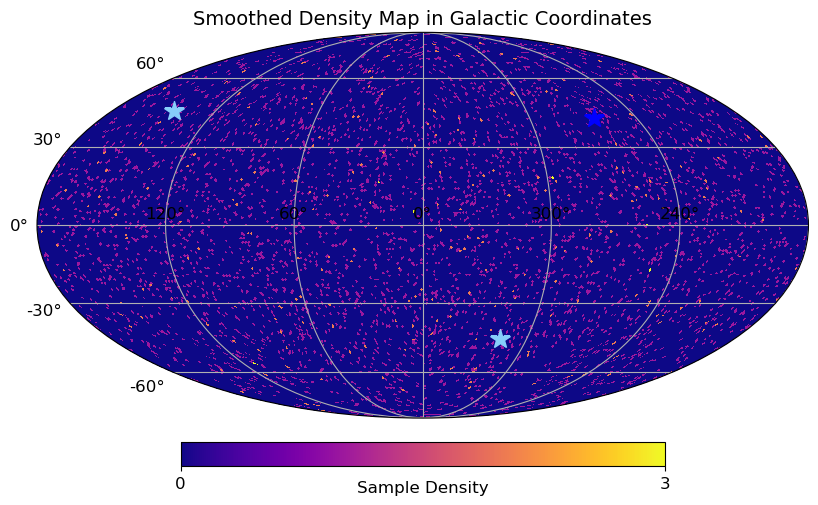

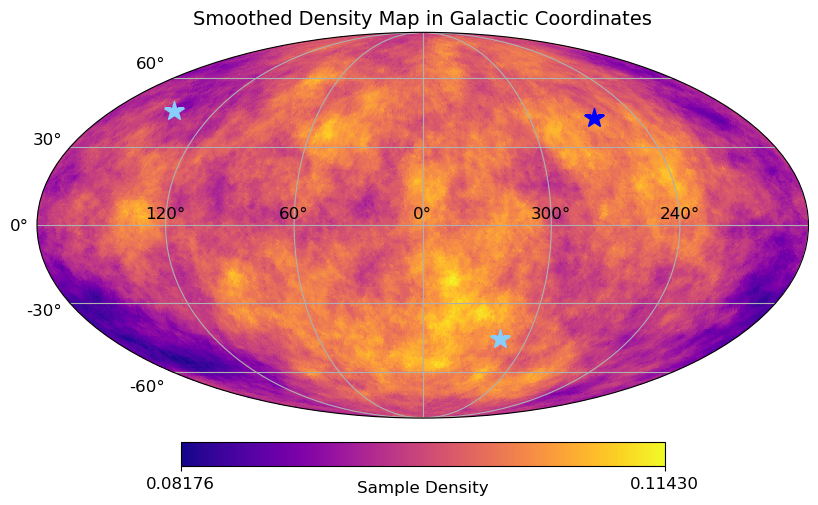

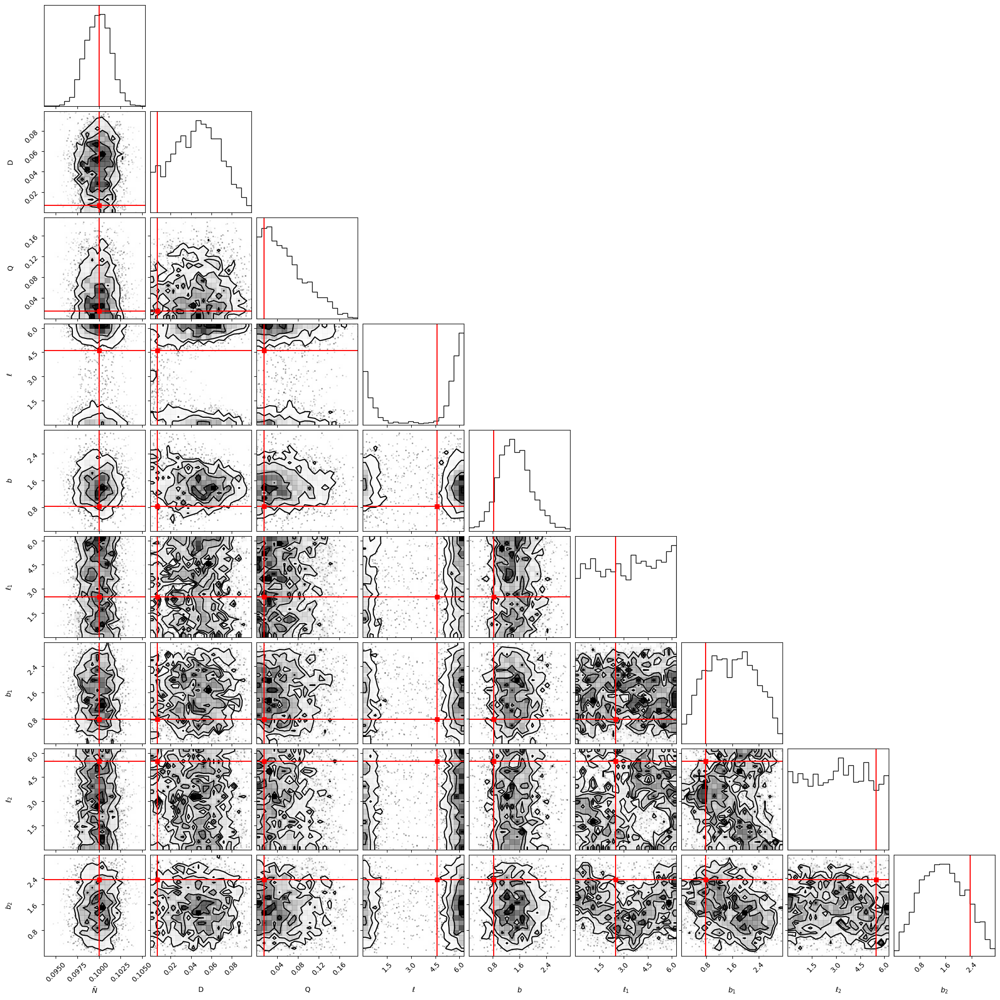

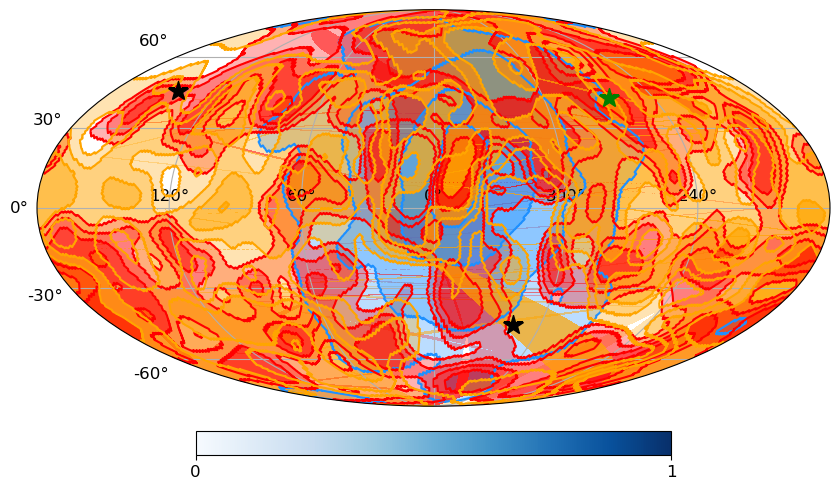

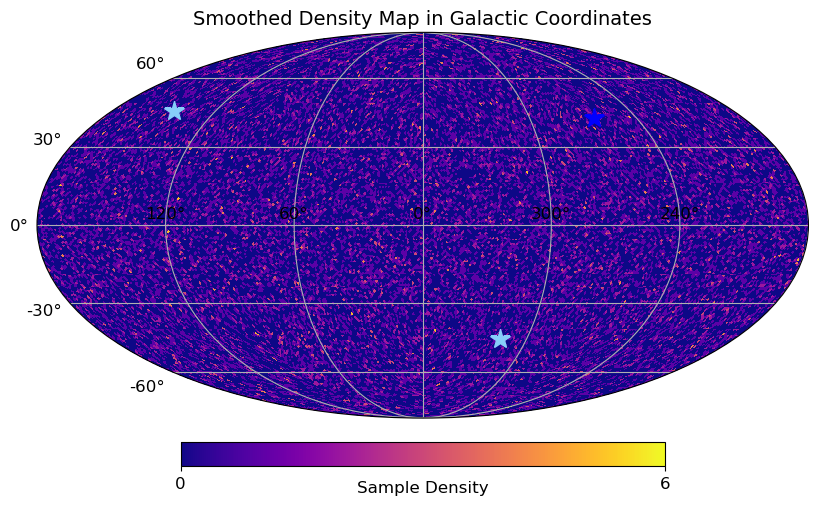

...

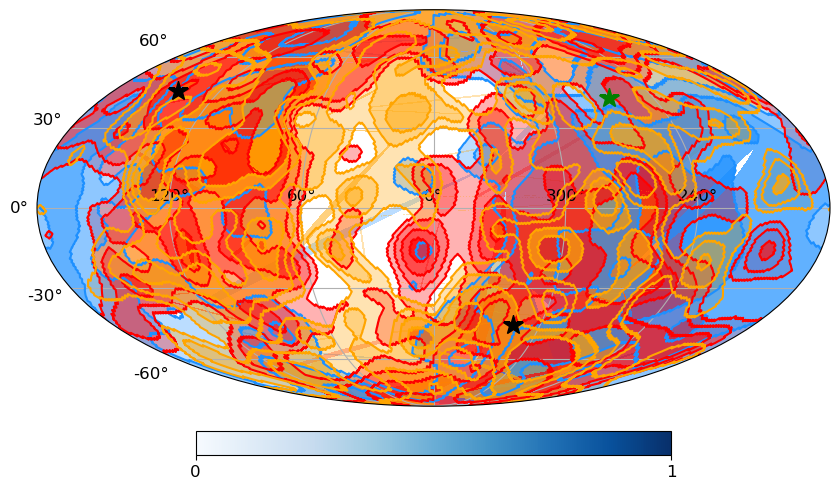

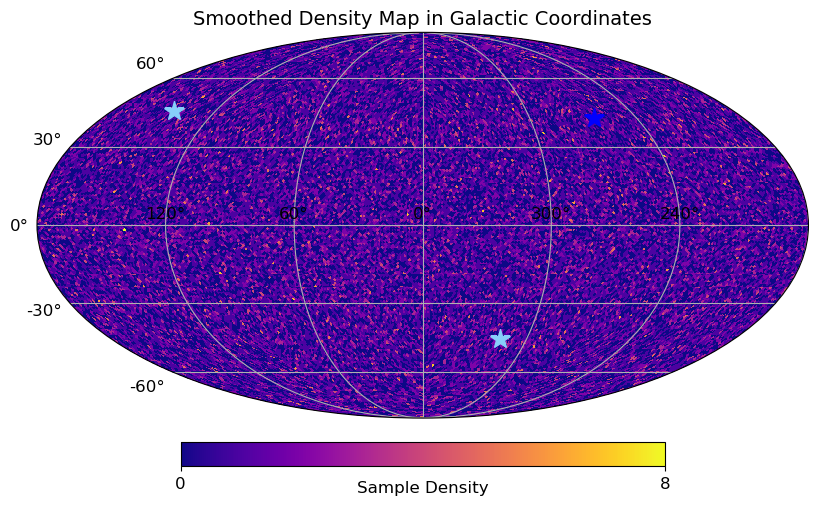

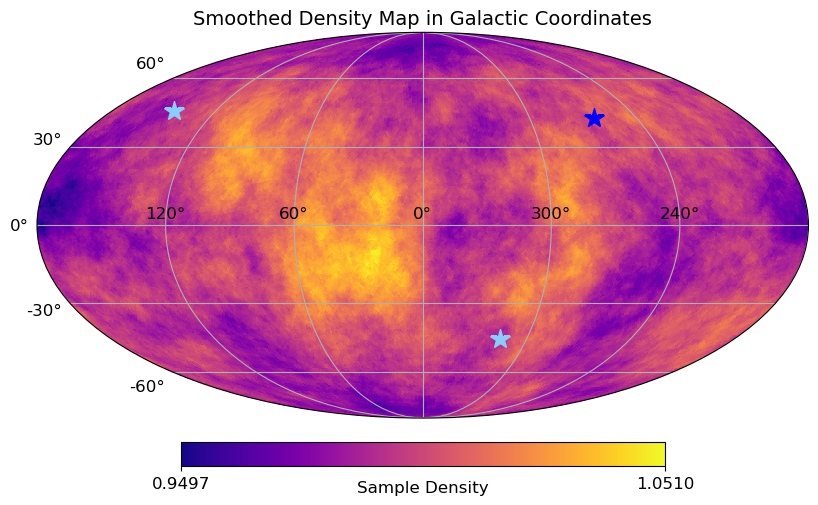

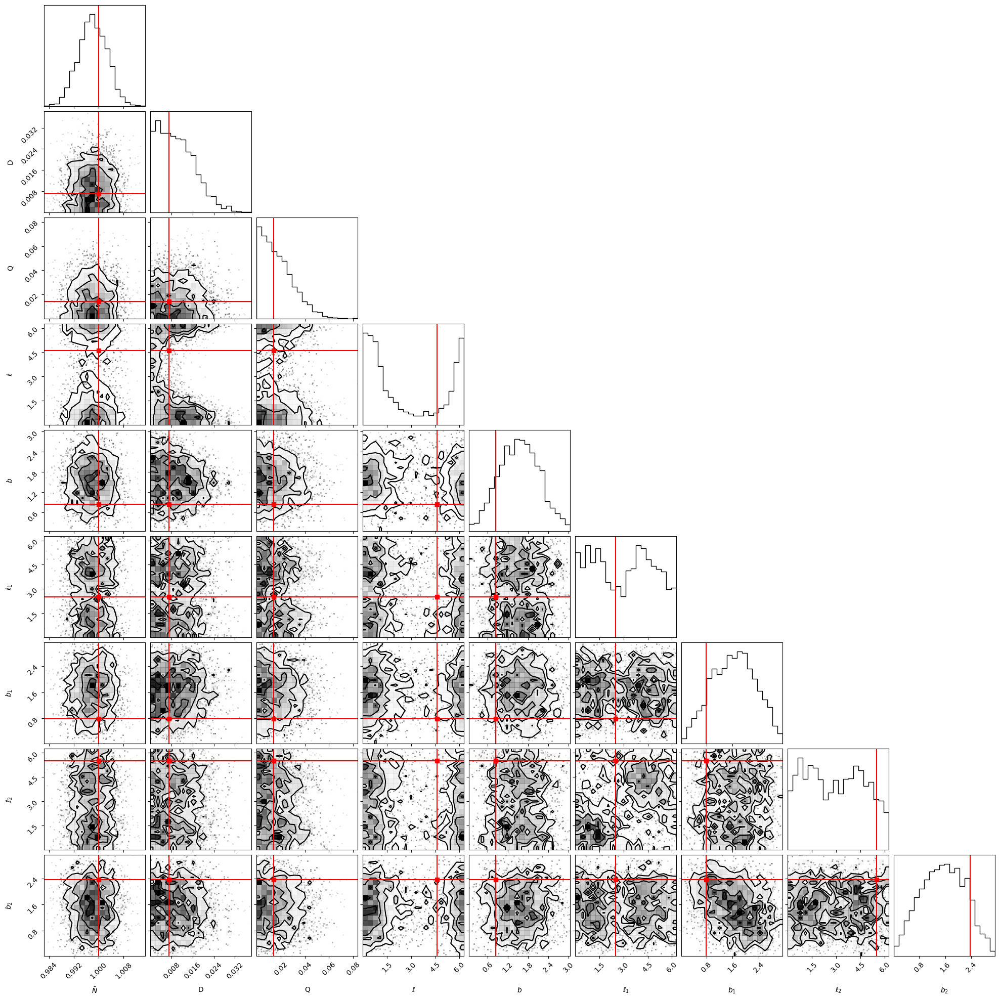

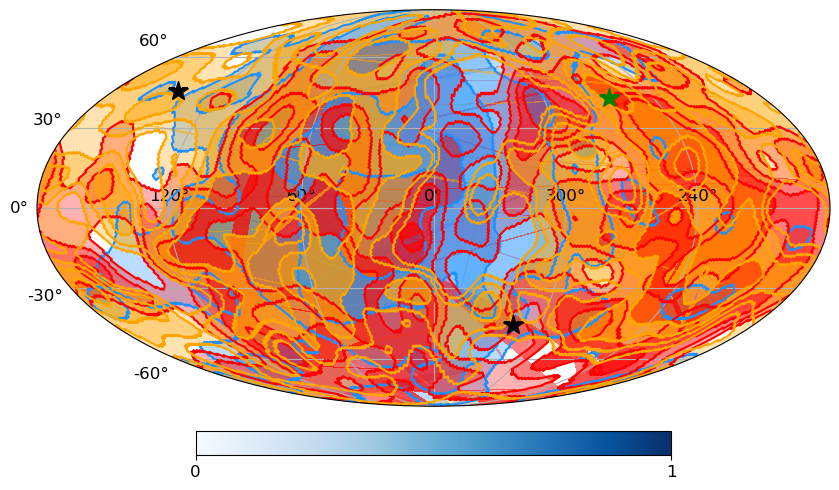

In [ ]:
Nbars = [0.1, 0.5, 1, 2, 5, 10, 20, 50, 100] 
np.random.seed(42)
NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
dipole_theta = np.radians(48)
dipole_phi = -np.radians(96)
dipole_vector = [dipole_theta, dipole_phi]
quad_vector_1 = [np.pi/4, np.pi*4/5] # (b1, l1)
quad_vector_2 = [np.pi*3/4 , -np.pi/4] # (b2, l2)

dipole = False
quadrupole = False
dipole_and_quadrupole = True
vectorised = True


for N in Nbars:
        np.random.seed(42)
        if vectorised == True:
               folder = 'vectorised'
        else:
                folder = 'regular'

        if dipole == True:
                m, lambda_true_array = dipole_sampling(NSIDE=64,  N_bar=N, D=0.007, dipole_theta=dipole_vector[0], dipole_phi=dipole_vector[1])

                # skymaps
                dipole_plotting(m, dipole_theta, dipole_phi,
                        title='Density Map in Galactic Coordinates', unit="Sample Density",
                        cmap='plasma')
                plt.savefig(f'../log_dir/testing/dipole/{folder}/skymap_Nbar_{N}_D_0.007.png', dpi=300)

                smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

                dipole_plotting(smoothed_map, dipole_theta, dipole_phi,
                        title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
                        cmap='plasma')
                plt.savefig(f'../log_dir/testing/dipole/{folder}/smoothed_skymap_Nbar_{N}_D_0.007.png', dpi=300)
                
                #corner plot
                samples = np.loadtxt(f'../log_dir/testing/dipole/{folder}/nbar_{N}/chains/equal_weighted_post.txt', skiprows=1)
                corner.corner(samples,
                        labels=[r'$\bar N$', 'D', r'$\ell$', r'$b$'],
                        truths=[N, 0.007, 2*np.pi - np.radians(96), np.radians(48)],
                        truth_color='r')
                plt.savefig(f'../log_dir/testing/dipole/{folder}/cornerplot_Nbar_{N}_D_0.007.png', dpi=300)
                plt.show()


                # contour distribution
                l, b = samples[:, 2], samples[:, 3]
                 
                smooth_sigma = 0.1
                smooth_map = process_vector_component(l, b, NSIDE, smooth_sigma)
                X, Y, P_xy, t_contours = get_projection_and_contours(smooth_map)
                alphas = [0.3,0.5,0.7,0.9]
                c = 'dodgerblue'
                
                #plot
                empty_map = np.full(hp.nside2npix(64), np.nan)
                hp.projview(empty_map, cmap="Blues", graticule=True, graticule_labels=True, min=0, max=1, cbar=False)   
                newprojplot(theta=dipole_theta, phi=dipole_phi, marker="*", color="r", markersize=20, zorder=5)
                
                # Fill the central most contour
                plt.contourf(X, Y, P_xy, levels=[t_contours[-1], P_xy.max()], colors=[c], alpha=alphas[-1])
    
                # Fill the other contours
                for i in range(len(t_contours) - 1):
                        plt.contourf(X, Y, P_xy, levels=[t_contours[i], t_contours[i+1]], colors=[c], alpha=alphas[i])

                # Plot the contour lines to show boundaries
                plt.contour(X, Y, P_xy, levels=t_contours, colors=c, linewidths=1.5)
                plt.tight_layout()

                plt.savefig(f'../log_dir/testing/dipole/{folder}/contourplot_Nbar_{N}_D_0.007.png', dpi=300)
                plt.show()

        elif quadrupole == True:
                m, lambda_true_array = quadrupole_sampling(NSIDE=64,  N_bar=N, Q=0.014, vector_1=quad_vector_1,
                                                        vector_2=quad_vector_2)
                # skymaps
                quadrupole_plotting(m, quad_vector_1, quad_vector_2,
                        title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
                        cmap='plasma')
                plt.savefig(f'../log_dir/testing/quadrupole/{folder}/skymap_Nbar_{N}_Q_0.014.png', dpi=300)

                smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

                quadrupole_plotting(smoothed_map, quad_vector_1, quad_vector_2,
                        title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
                        cmap='plasma')
                plt.savefig(f'../log_dir/testing/quadrupole/{folder}/smoothed_skymap_Nbar_{N}_Q_0.014.png', dpi=300)

                # corner plot
                samples = np.loadtxt(f'../log_dir/testing/quadrupole/{folder}/nbar_{N}/chains/equal_weighted_post.txt', skiprows=1)
                corner.corner(samples,
                              
                        labels=[r'$\bar N$', 'Q', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$'],
                        truths=[N, 0.014, np.pi*4/5, np.pi/4, 2*np.pi - np.pi/4, np.pi*3/4],
                        truth_color='r')
                plt.savefig(f'../log_dir/testing/quadrupole/{folder}/cornerplot_Nbar_{N}_Q_0.014.png', dpi=300)
                plt.show()
        
                # contour distribution
                l1, b1 = samples[:, 2], samples[:, 3]
                l2, b2 = samples[:, 4], samples[:, 5]

                smooth_sigma = 0.1
                smooth_map1 = process_vector_component(l1, b1, NSIDE, smooth_sigma)
                smooth_map2 = process_vector_component(l2, b2, NSIDE, smooth_sigma)
                X1, Y1, P_xy1, t_contours1 = get_projection_and_contours(smooth_map1)
                X2, Y2, P_xy2, t_contours2 = get_projection_and_contours(smooth_map2)
                alphas = [0.3,0.5,0.7,0.9]
                c1, c2 = 'red', 'orange'
                
                #plot
                empty_map = np.full(hp.nside2npix(64), np.nan)
                hp.projview(empty_map, cmap="Blues", graticule=True, graticule_labels=True, min=0, max=1, cbar=False)   
                newprojplot(theta=quad_vector_1[0], phi=quad_vector_1[1], marker="*", color="k", markersize=15, zorder=5)
                newprojplot(theta=quad_vector_2[0], phi=quad_vector_2[1], marker="*", color="k", markersize=15, zorder=5)

                # Fill the central most contour
                plt.contourf(X1, Y1, P_xy1, levels=[t_contours1[-1], P_xy1.max()], colors=[c1], alpha=alphas[-1])
                plt.contourf(X2, Y2, P_xy2, levels=[t_contours2[-1], P_xy2.max()], colors=[c2], alpha=alphas[-1]) 

                # Fill the other contours
                for i in range(len(t_contours) - 1):
                        plt.contourf(X1, Y1, P_xy1, levels=[t_contours1[i], t_contours1[i+1]], colors=[c1], alpha=alphas[i])
                        plt.contourf(X2, Y2, P_xy2, levels=[t_contours2[i], t_contours2[i+1]], colors=[c2], alpha=alphas[i])

                # Plot the contour lines to show boundaries
                plt.contour(X1, Y1, P_xy1, levels=t_contours1, colors=c1, linewidths=1.5)
                plt.contour(X2, Y2, P_xy2, levels=t_contours2, colors=c2, linewidths=1.5)
                plt.tight_layout()
                plt.savefig(f'../log_dir/testing/quadrupole/{folder}/contour_plot_Nbar_{N}_Q_0.014.png', dpi=300)
                plt.show()

        elif dipole_and_quadrupole == True:
                m, lambda_true_array = dipole_quad_sampling(NSIDE=64,  N_bar=N, D=0.007, d_vector=dipole_vector,
                                                        Q=0.014, q_vector_1=quad_vector_1, q_vector_2=quad_vector_2)

                # skymaps
                dipole_quad_plotting(m, dipole_vector, quad_vector_1, quad_vector_2,
                        title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
                        cmap='plasma')
                plt.savefig(f'../log_dir/testing/dipole_quadrupole/{folder}/skymap_Nbar_{N}_D_0.007_Q_0.014.png', dpi=300)

                smoothed_map = compute_smooth_map(m, weights=None, angle_scale=1)

                dipole_quad_plotting(smoothed_map, dipole_vector, quad_vector_1, quad_vector_2,
                        title='Smoothed Density Map in Galactic Coordinates', unit="Sample Density",
                        cmap='plasma')
                plt.savefig(f'../log_dir/testing/dipole_quadrupole/{folder}/smoothed_skymap_Nbar_{N}_D_0.007_Q_0.014.png', dpi=300)

                # corner plot
                samples = np.loadtxt(f'../log_dir/testing/dipole_quadrupole/{folder}/nbar_{N}/chains/equal_weighted_post.txt', skiprows=1)
                corner.corner(samples, 
                        labels=[r'$\bar N$', 'D', 'Q', r'$\ell$', r'$b$', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$'],
                        truths=[N, 0.007, 0.014, 2*np.pi - np.radians(96), np.radians(48),
                                np.pi*4/5, np.pi/4, np.pi*2 - np.pi/4, np.pi*3/4],
                        truth_color='r')
                plt.savefig(f'../log_dir/testing/dipole_quadrupole/{folder}/cornerplot_Nbar_{N}_D_0.007_Q_0.014.png', dpi=300)
                plt.show()

                # contour distribution
                l, b = samples[:, 3], samples[:, 4]
                l1, b1 = samples[:, 5], samples[:, 6]
                l2, b2 = samples[:, 7], samples[:, 8]

                # Create maps for each vector
                smooth_sigma = 0.1
                smooth_map = process_vector_component(l, b, NSIDE, smooth_sigma)
                smooth_map1 = process_vector_component(l1, b1, NSIDE, smooth_sigma)
                smooth_map2 = process_vector_component(l2, b2, NSIDE, smooth_sigma)

                X, Y, P_xy, t_contours = get_projection_and_contours(smooth_map)
                X1, Y1, P_xy1, t_contours1 = get_projection_and_contours(smooth_map1)
                X2, Y2, P_xy2, t_contours2 = get_projection_and_contours(smooth_map2)
                alphas = [0.3,0.5,0.7,0.9]
                c, c1, c2 = 'dodgerblue', 'red', 'orange'

                #plot
                empty_map = np.full(hp.nside2npix(64), np.nan)
                hp.projview(empty_map, cmap="Blues", graticule=True, graticule_labels=True, min=0, max=1, cbar=False)   
                newprojplot(theta=dipole_theta, phi=dipole_phi, marker="*", color="green", markersize=15, zorder=5)
                newprojplot(theta= quad_vector_1[0], phi=quad_vector_1[1], marker="*", color="k", markersize=15, zorder=5)
                newprojplot(theta=quad_vector_2[0], phi=quad_vector_2[1], marker="*", color="k", markersize=15, zorder=5)
                
                plt.contourf(X, Y, P_xy, levels=[t_contours[-1], P_xy.max()], colors=[c], alpha=alphas[-1])
                plt.contourf(X1, Y1, P_xy1, levels=[t_contours1[-1], P_xy1.max()], colors=[c1], alpha=alphas[-1])
                plt.contourf(X2, Y2, P_xy2, levels=[t_contours2[-1], P_xy2.max()], colors=[c2], alpha=alphas[-1]) 
                
                # Fill the other contours
                for i in range(len(t_contours) - 1):
                        plt.contourf(X, Y, P_xy, levels=[t_contours[i], t_contours[i+1]], colors=[c], alpha=alphas[i])
                        plt.contourf(X1, Y1, P_xy1, levels=[t_contours1[i], t_contours1[i+1]], colors=[c1], alpha=alphas[i])
                        plt.contourf(X2, Y2, P_xy2, levels=[t_contours2[i], t_contours2[i+1]], colors=[c2], alpha=alphas[i])

                # Plot the contour lines to show boundaries
                plt.contour(X, Y, P_xy, levels=t_contours, colors=c, linewidths=1.5)
                plt.contour(X1, Y1, P_xy1, levels=t_contours1, colors=c1, linewidths=1.5)
                plt.contour(X2, Y2, P_xy2, levels=t_contours2, colors=c2, linewidths=1.5)
                plt.tight_layout()

                plt.savefig(f'../log_dir/testing/dipole_quadrupole/{folder}/contour_plot_Nbar_{N}_D_0.007_Q_0.014.png', dpi=300)
                plt.show()

In [ ]:
import pandas as pd
#  convert samples to pandas dataframe
df = pd.DataFrame(samples, columns=[r'$\bar N$', 'D', 'Q', r'$\ell$', r'$b$', r'$\ell_1$', r'$b_1$', r'$\ell_2$', r'$b_2$'])
df
